# Data Description
Data source: https://www.kaggle.com/harlfoxem/housesalesprediction

# Imports

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set(color_codes=True)

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set(context='notebook', style='whitegrid', rc={'figure.figsize': (12,8)})
plt.style.use('ggplot') # better than sns styles.
matplotlib.rcParams['figure.figsize'] = 12,8

import os
import time

# random state
SEED=100
np.random.seed(SEED)

# Jupyter notebook settings for pandas
#pd.set_option('display.float_format', '{:,.2g}'.format) # numbers sep by comma
pd.options.display.float_format = '{:,}'.format # df.A.value_counts().astype(float)
from pandas.api.types import CategoricalDtype
np.set_printoptions(precision=3)

pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100) # None for all the rows
pd.set_option('display.max_colwidth', 200)

import IPython
from IPython.display import display, HTML, Image, Markdown

print([(x.__name__,x.__version__) for x in [np, pd,sns,matplotlib]])

[('numpy', '1.17.4'), ('pandas', '0.25.3'), ('seaborn', '0.9.0'), ('matplotlib', '3.1.2')]


In [0]:
%%capture
# capture will not print in notebook

import os
import sys
ENV_COLAB = 'google.colab' in sys.modules

if ENV_COLAB:
    ## mount google drive
    # from google.colab import drive
    # drive.mount('/content/drive')
    # dat_dir = 'drive/My Drive/Colab Notebooks/data/'
    # sys.path.append(dat_dir)

    ## Image dir
    # img_dir = 'drive/My Drive/Colab Notebooks/images/'
    # if not os.path.isdir(img_dir): os.makedirs(img_dir)
    # sys.path.append(img_dir)

    ## Output dir
    # out_dir = 'drive/My Drive/Colab Notebooks/outputs/'
    # if not os.path.isdir(out_dir): os.makedirs(out_dir)
    # sys.path.append(out_dir)

    ## Also install my custom module
    # module_dir = 'drive/My Drive/Colab Notebooks/Bhishan_Modules/' 
    # sys.path.append(module_dir)
    # !cd drive/My Drive/Colab Notebooks/Bhishan_Modules/
    # !pip install -e bhishan
    # !cd -

    ## pip install
    #!pip install pyldavis
    # !pip install catboost
    #!pip install category_encoders # TargetEncoder

    # hyper parameter tuning
    # !pip install hyperopt
    #!pip install optuna # hyper param opt

    # model evaluation
    # !pip install shap
    !pip install eli5
    !pip install lime
    !pip install duecredit # forestci needs this
    !pip install forestci # fci.random_forest_error(model_rf, Xtrain,Xtest)
    !pip install dtreeviz # decision tree viz

    # faster pandas
    # df['x'].swifter.apply(myfunc)
    # df[['x','y']].swifter.apply(myfunc,pos_arg,keyword_arg=mykeyword_arg)
    # !pip install swifter
    
    # update modules
    # !pip install -U scikit-learn # we need restart
    import sklearn

    # update pandas profiling
    # profile = df.profile_report(style={'full_width':True})
    # profile.to_file(output_file="output.html")
    !pip install -U pandas-profiling # we need restart
    import pandas_profiling


    # Note: We need to restart kernel to use tqdm
    # from tqdm.notebook import trange, tqdm
    # tqdm.pandas()
    # out = df['A'].progress_apply(myfunc)
    !pip install -U tqdm

    # print
    print('Environment: Google Colaboratory.')

# NOTE: If we update modules in gcolab, we need to restart runtime.

In [0]:
import forestci as fci

In [4]:
!pip freeze | grep prof

pandas-profiling==2.3.0


In [5]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [0]:
import pydotplus
from IPython.display import Image 

In [7]:
import tqdm


import eli5
import lime
import yellowbrick

from eli5 import show_weights
from eli5 import show_prediction

import lime.lime_tabular

Using TensorFlow backend.


# Load the Data

In [8]:
ifile = "https://github.com/bhishanpdl/Project_House_Price_Prediction/blob/master/data/processed/data_cleaned.csv?raw=true"
df = pd.read_csv(ifile)
print(df.shape)

df['price'] = df['price']/1e6 # millions


df.head().T

(21613, 37)


,0,1,2,3,4
date,2014-10-13,2014-12-09,2015-02-25,2014-12-09,2015-02-18
price,0.2219,0.538,0.18,0.604,0.51
bedrooms,3,3,2,4,3
bathrooms,1.0,2.25,1.0,3.0,2.0
sqft_living,1180,2570,770,1960,1680
sqft_lot,5650,7242,10000,5000,8080
floors,1.0,2.0,1.0,1.0,1.0
waterfront,0,0,0,0,0
view,0,0,0,0,0
condition,3,3,3,5,3


In [9]:
df.columns.to_numpy()

array(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated',
       'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15',
       'yr_sales', 'age', 'yr_renovated2', 'age_after_renovation',
       'zipcode_top10', 'zipcode_houses', 'basement_bool',
       'renovation_bool', 'age_cat', 'age_after_renovation_cat',
       'log1p_price', 'log1p_sqft_living', 'log1p_sqft_lot',
       'log1p_sqft_above', 'log1p_sqft_basement', 'log1p_sqft_living15',
       'log1p_sqft_lot15'], dtype=object)

In [10]:
df.dtypes

date                         object
price                       float64
bedrooms                      int64
bathrooms                   float64
sqft_living                   int64
sqft_lot                      int64
floors                      float64
waterfront                    int64
view                          int64
condition                     int64
grade                         int64
sqft_above                    int64
sqft_basement                 int64
yr_built                      int64
yr_renovated                  int64
zipcode                       int64
lat                         float64
long                        float64
sqft_living15                 int64
sqft_lot15                    int64
yr_sales                      int64
age                           int64
yr_renovated2                 int64
age_after_renovation          int64
zipcode_top10                object
zipcode_houses                int64
basement_bool                 int64
renovation_bool             

In [0]:
df.drop(['date','zipcode_top10'],axis=1,inplace=True)

# Features

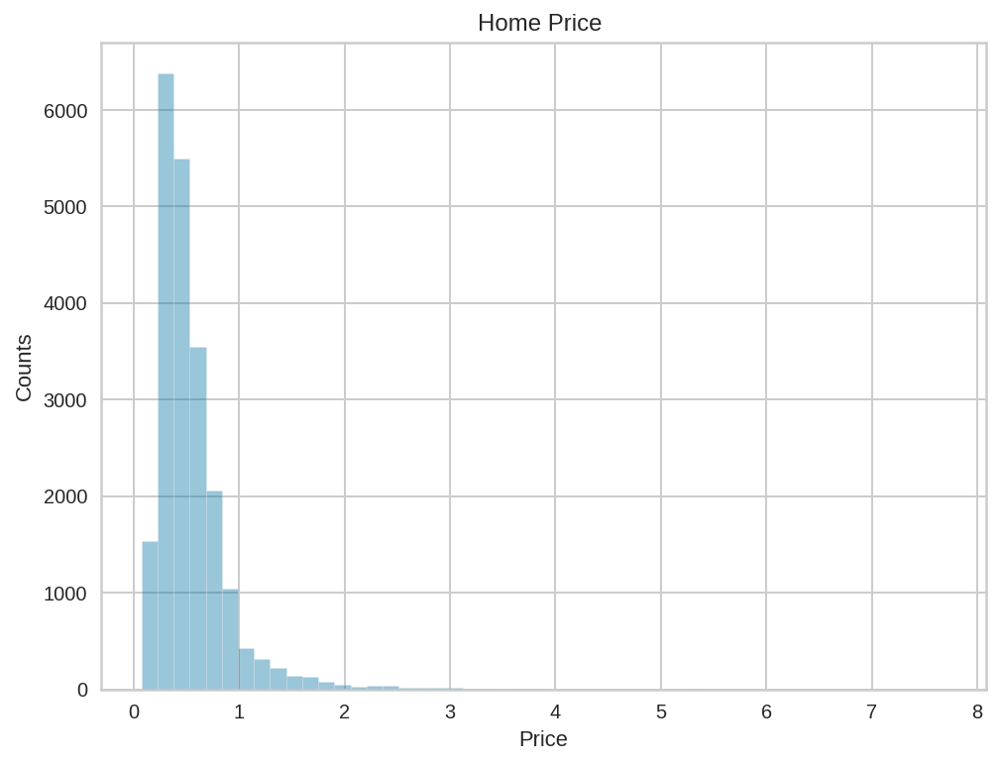

In [12]:
fig, ax = plt.subplots(figsize=(8,6)); 
sns.distplot(df['price'], kde=False, ax=ax);
ax.set_ylabel("Counts");
ax.set_xlabel("Price")
ax.set_title("Home Price ");

# distribution is non-gaussian with right tail

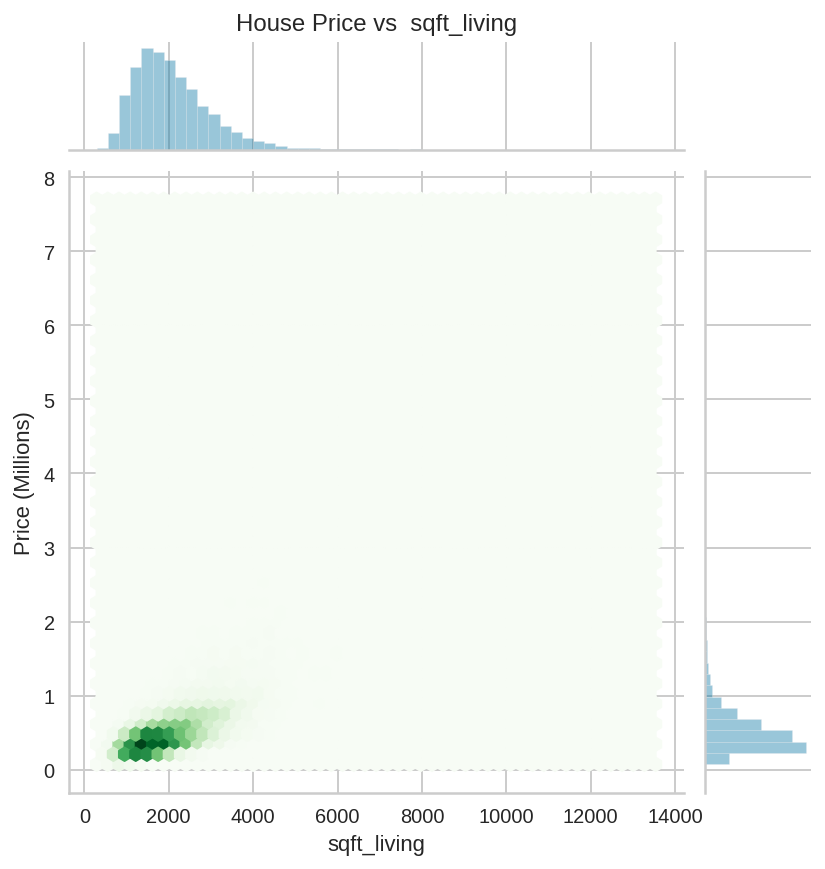

In [13]:
col = 'sqft_living'
g = sns.jointplot(df[col], df['price'], kind='hex',cmap='Greens')
g.ax_marg_x.set_title(f"House Price vs  {col}");
g.set_axis_labels(xlabel=f'{col}', ylabel='Price (Millions)');

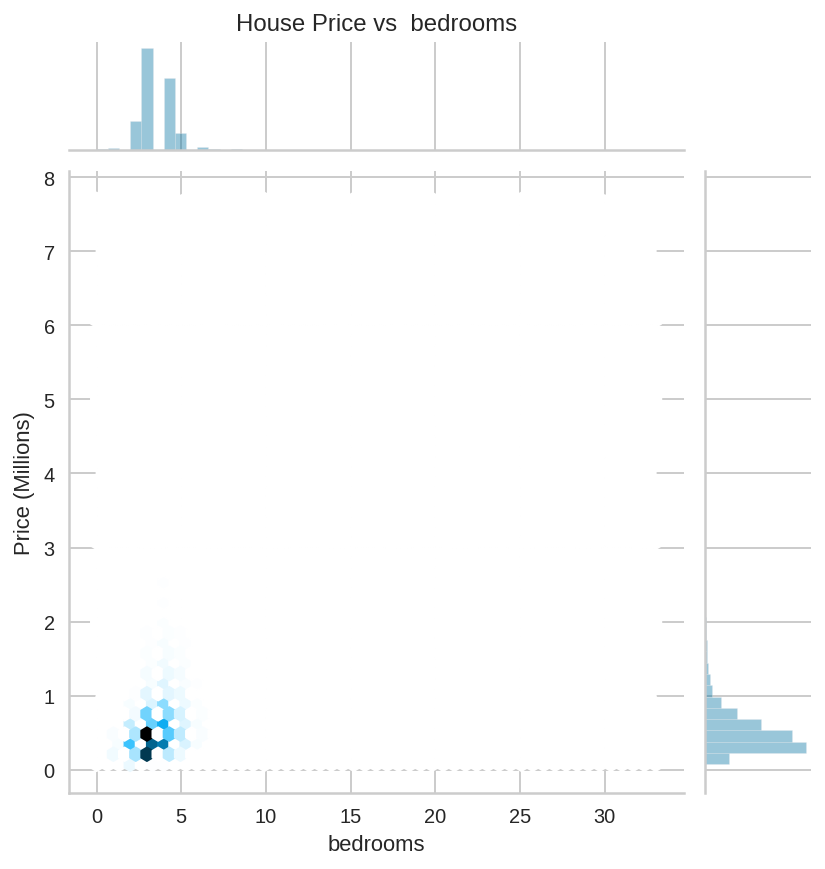

In [14]:
col = 'bedrooms'
g = sns.jointplot(df[col], df['price'], kind='hex')
g.ax_marg_x.set_title(f"House Price vs  {col}");
g.set_axis_labels(xlabel=f'{col}', ylabel='Price (Millions)');

# very few houses have more than 5 bedrooms

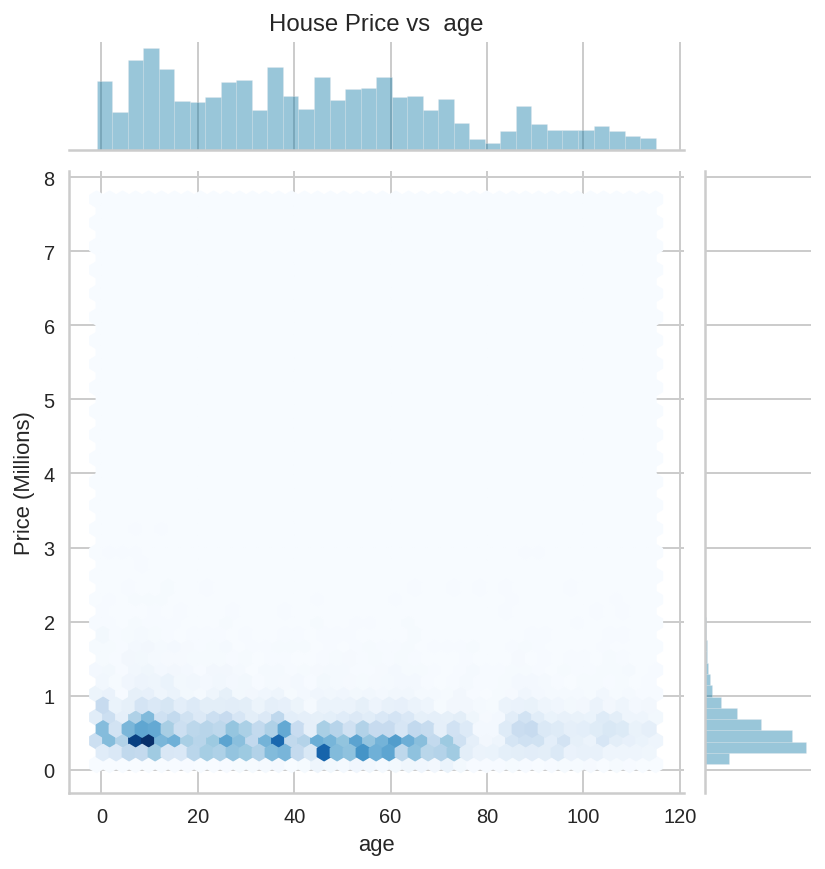

In [15]:
col = 'age'
g = sns.jointplot(df[col], df['price'], kind='hex',cmap='Blues')
g.ax_marg_x.set_title(f"House Price vs  {col}");
g.set_axis_labels(xlabel=f'{col}', ylabel='Price (Millions)');

# when age increase, price decreases

In [16]:
df.columns.to_numpy()

array(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat',
       'long', 'sqft_living15', 'sqft_lot15', 'yr_sales', 'age',
       'yr_renovated2', 'age_after_renovation', 'zipcode_houses',
       'basement_bool', 'renovation_bool', 'age_cat',
       'age_after_renovation_cat', 'log1p_price', 'log1p_sqft_living',
       'log1p_sqft_lot', 'log1p_sqft_above', 'log1p_sqft_basement',
       'log1p_sqft_living15', 'log1p_sqft_lot15'], dtype=object)

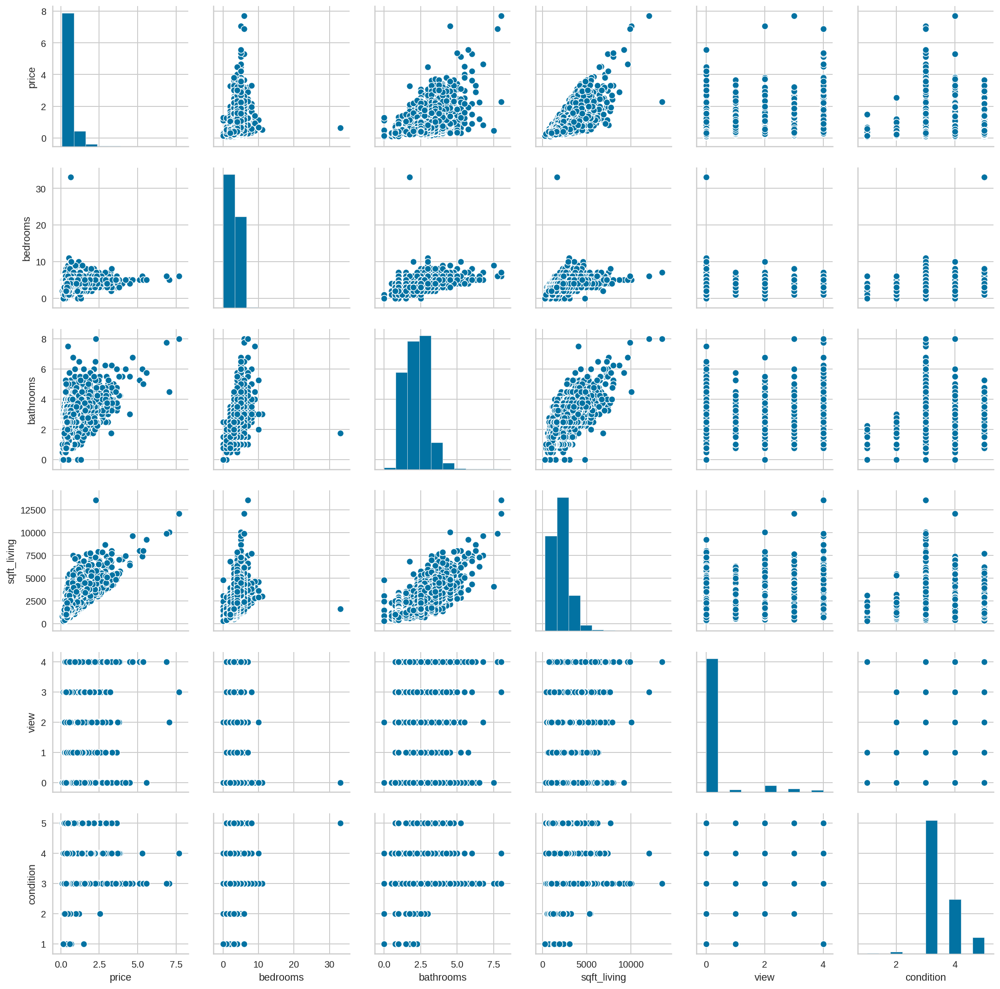

In [17]:
time_start = time.time()

myfeatures = ['price','bedrooms','bathrooms','sqft_living','view','condition']
sns.pairplot(df[myfeatures])

time_taken = time.time() - time_start
print('Time taken: {:.0f} min {:.0f} secs'.format(*divmod(time_taken,60)))

plt.show()

# Correlations

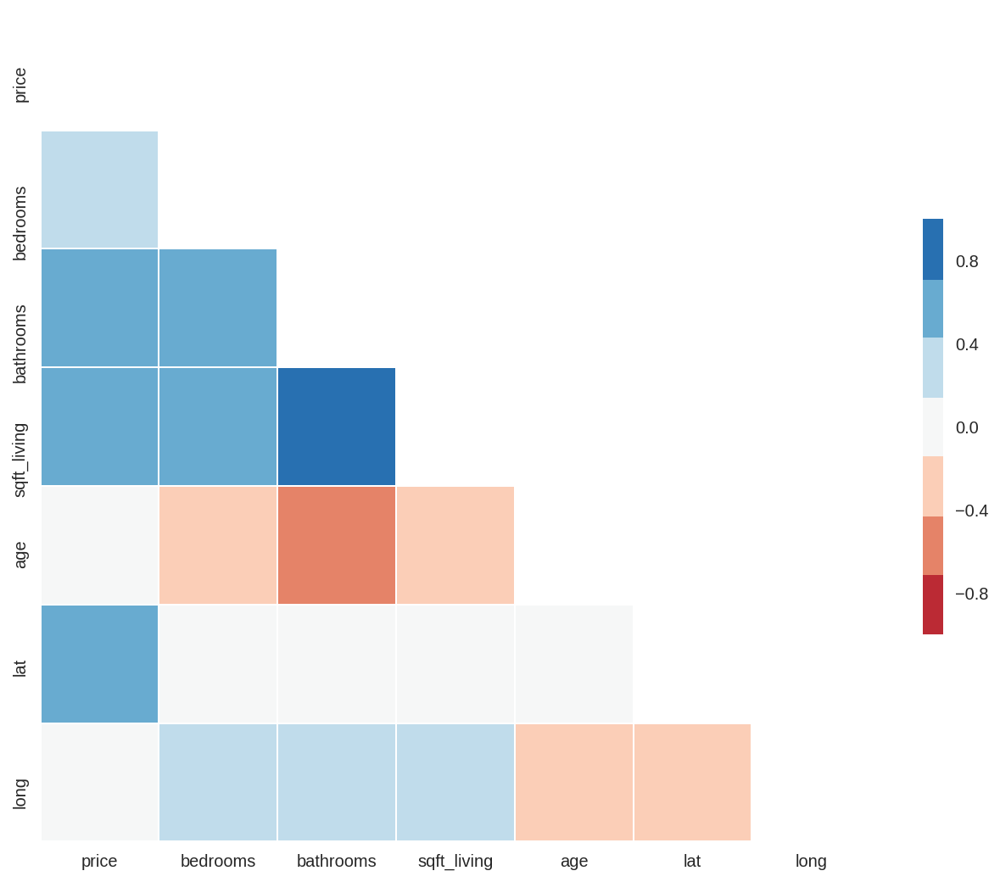

In [18]:
corr = df[['price', 'bedrooms', 'bathrooms',
           'sqft_living','age','lat','long']].corr('spearman')

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)
cmap = sns.color_palette("RdBu", 7)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, vmax=1.0, vmin=-1.0, center=0, cmap=cmap,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

# Pandas Profiling

In [19]:
df.profile_report(style={'full_width':True})

# Train-Test Split

In [20]:
df.head(2)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sales,age,yr_renovated2,age_after_renovation,zipcode_houses,basement_bool,renovation_bool,age_cat,age_after_renovation_cat,log1p_price,log1p_sqft_living,log1p_sqft_lot,log1p_sqft_above,log1p_sqft_basement,log1p_sqft_living15,log1p_sqft_lot15
0,0.2219,3,1.0,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,2014,59,1955,59,262,0,0,5,5,12.309986615445005,7.074116816197362,8.639587799629844,7.074116816197362,0.0,7.201170883281678,8.639587799629844
1,0.538,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,63,1991,23,410,1,1,5,2,13.195615697878251,7.852050207265888,8.887790764195326,7.6829431698782935,5.9939614273065684,7.43307534889858,8.941152882160566


In [21]:
target = 'price'
df_Xtrain, df_Xtest, ser_ytrain, ser_ytest = sklearn.model_selection.train_test_split(df.drop(target, axis=1), 
                                                                            df[target],
                                                                            train_size=0.8,
                                                                            random_state=SEED)
Xtrain = df_Xtrain.to_numpy()
ytrain = ser_ytrain.to_numpy().ravel()

Xtest = df_Xtest.to_numpy()
ytest = ser_ytest.to_numpy().ravel()

df_Xtrain.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sales,age,yr_renovated2,age_after_renovation,zipcode_houses,basement_bool,renovation_bool,age_cat,age_after_renovation_cat,log1p_price,log1p_sqft_living,log1p_sqft_lot,log1p_sqft_above,log1p_sqft_basement,log1p_sqft_living15,log1p_sqft_lot15
16000,3,1.75,1780,11096,1.0,0,0,3,7,1210,570,1979,0,98074,47.617,-122.051,1780,10640,2014,35,1979,35,441,1,0,3,3,12.691583538230214,7.484930283289661,9.314430080500564,7.099201743553093,6.3473892096560105,7.484930283289661,9.272469743441732
11286,2,2.5,1420,2229,2.0,0,0,3,7,1420,0,2004,0,98059,47.4871,-122.165,1500,2230,2014,10,2004,10,468,0,0,0,0,12.53537998978861,7.2591161280971015,7.709756864454165,7.2591161280971015,0.0,7.313886831633463,7.710205194432532
3201,2,1.0,1790,4000,1.0,0,0,4,7,1040,750,1923,0,98112,47.6405,-122.301,1310,4000,2014,91,1923,91,269,1,0,7,7,13.47302165746721,7.490529402060711,8.294299608857235,6.947937068614969,6.621405651764134,7.178545483763701,8.294299608857235
11049,4,1.0,1710,117176,1.5,0,0,4,6,1710,0,1942,0,98055,47.4497,-122.212,1940,12223,2014,72,1942,72,268,0,0,6,6,12.873648139727594,7.4448332738921925,11.671440891132548,7.4448332738921925,0.0,7.57095858316901,9.411156511406302
9716,4,1.0,1150,5217,1.5,0,0,3,7,1150,0,1951,0,98115,47.6806,-122.287,1220,5217,2015,64,1951,64,583,0,0,5,5,13.100119813444692,7.048386408721884,8.559869465696673,7.048386408721884,0.0,7.107425474110705,8.559869465696673


# Target Distribution in Train and Test

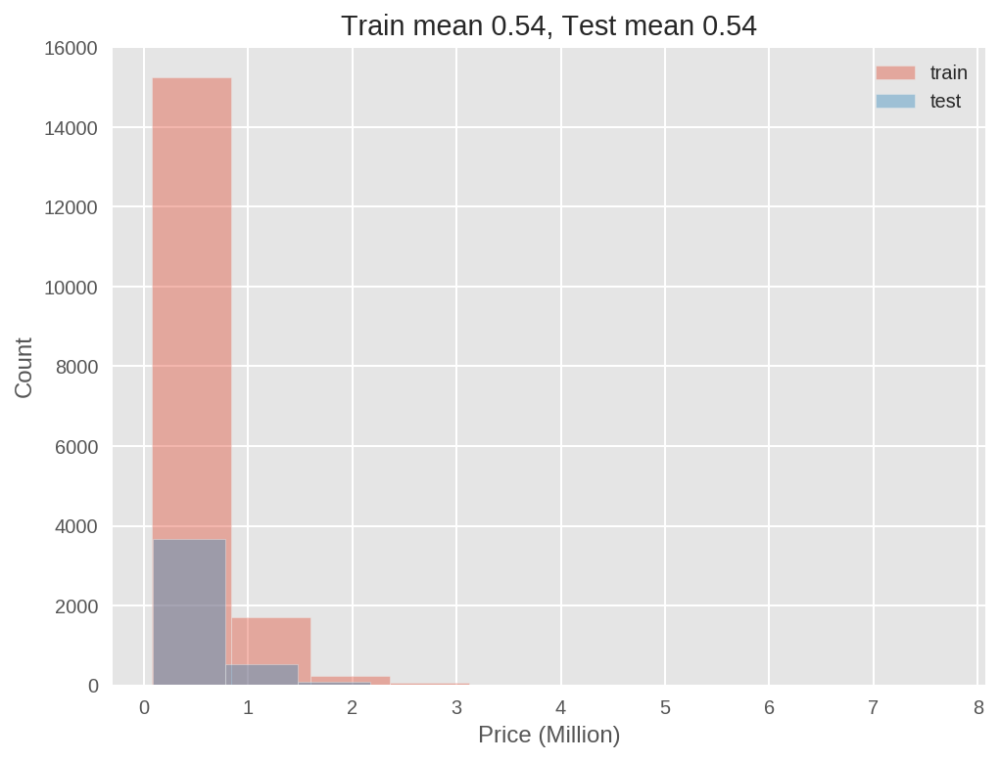

In [22]:
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(8,6));
bins=10
sns.distplot(ytrain, kde=False, ax=ax, label="train", bins=bins);
sns.distplot(ytest, kde=False, ax=ax, label="test", bins=bins);
ax.legend();
ax.set_ylabel('Count')
ax.set_xlabel('Price (Million)')

ax.set_title("Train mean {:0.2f},\
 Test mean {:0.2f}".format(ytrain.mean(), ytest.mean()));
plt.show()

# Modelling: Random Forest

In [23]:
model = sklearn.ensemble.RandomForestRegressor(n_estimators=100,
                                             random_state=SEED)

print("Sizes for train {}, test {}".format(Xtrain.shape, Xtest.shape))
model.fit(Xtrain, ytrain)

Sizes for train (17290, 34), test (4323, 34)


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=100, verbose=0,
                      warm_start=False)

In [24]:
from sklearn.metrics import mean_squared_error

mse_train = mean_squared_error(ytrain, model.predict(Xtrain))
mse_test = mean_squared_error(ytest, model.predict(Xtest))

print(f'Random Forest mean-squared error on train set: {mse_train:.5f}')
print(f'Random Forest mean-squared error on test  set: {mse_test:.5f}')

Random Forest mean-squared error on train set: 0.00004
Random Forest mean-squared error on test  set: 0.00027


# Yellowbrick Visualization

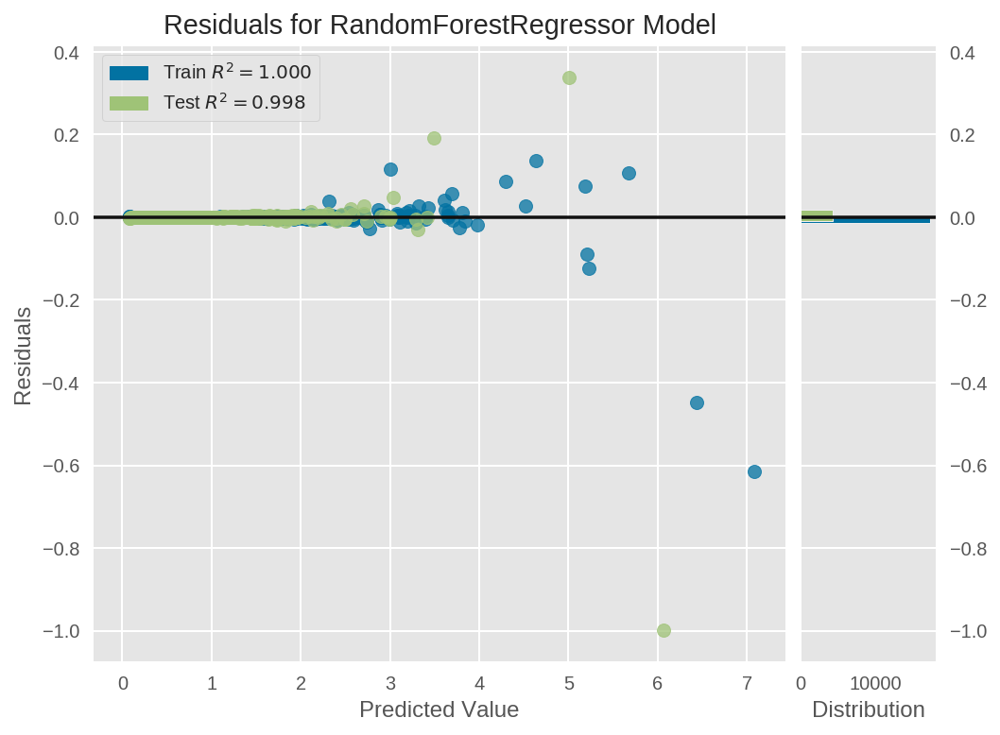

In [25]:
from yellowbrick.regressor import PredictionError, ResidualsPlot

# resuduals vs predicted values
fig, ax = plt.subplots(figsize=(8,6)); 
visualizer = ResidualsPlot(model, ax=ax)

visualizer.fit(Xtrain, ytrain)  
visualizer.score(Xtest, ytest) 


g = visualizer.poof()

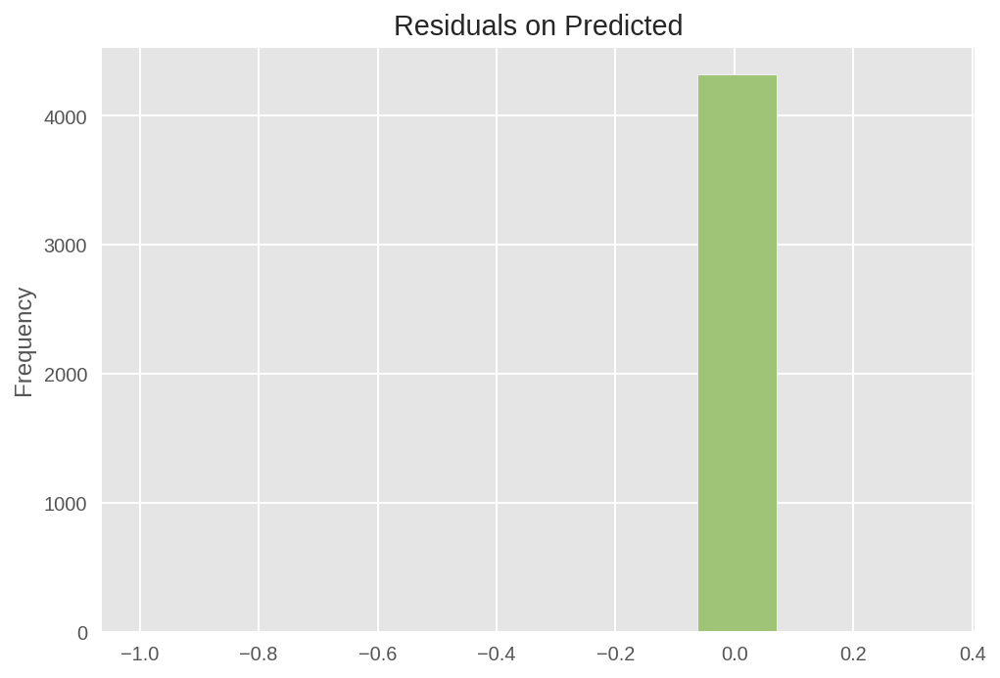

In [26]:
ser_test_resids = pd.Series(model.predict(Xtest) - ytest)

ax = ser_test_resids.plot(kind="hist", bins=10,
                          title="Residuals on Predicted", color='g', alpha=1);
plt.show()


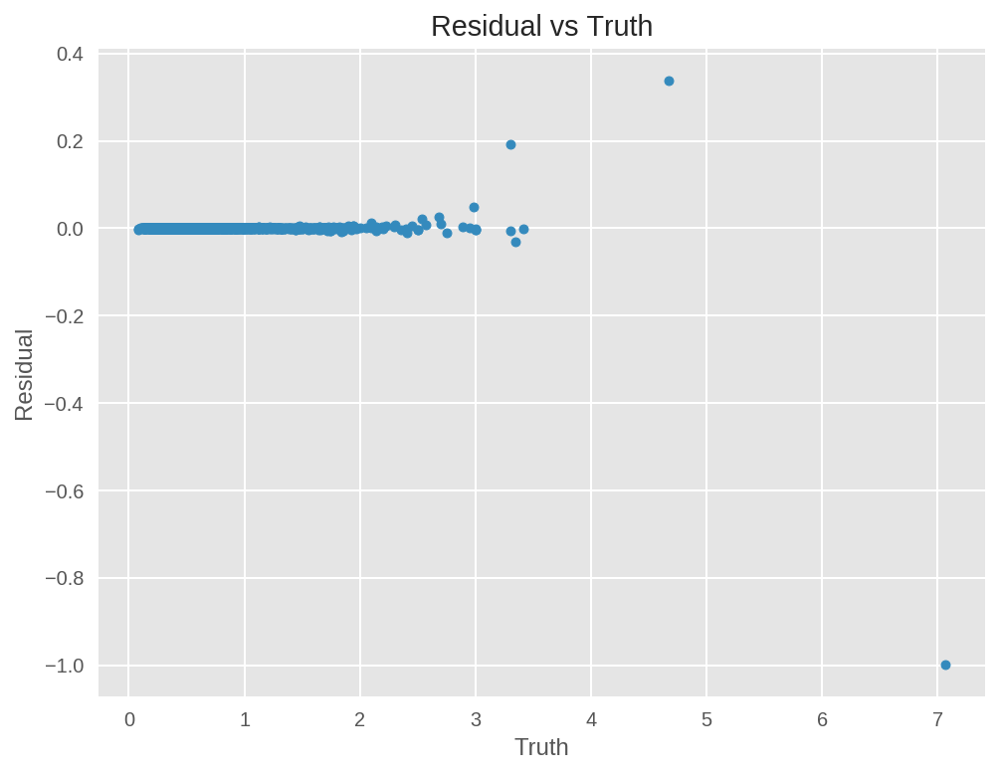

In [27]:
# residuals vs true values

dfx = pd.DataFrame({'Residual': ser_test_resids.to_numpy(), 'Truth': ytest})
fig, ax = plt.subplots(figsize=(8,6)); 

dfx.plot(kind="scatter", x='Truth', y='Residual', ax=ax,
         title="Residual vs Truth");

## Prediction Error vs Truth

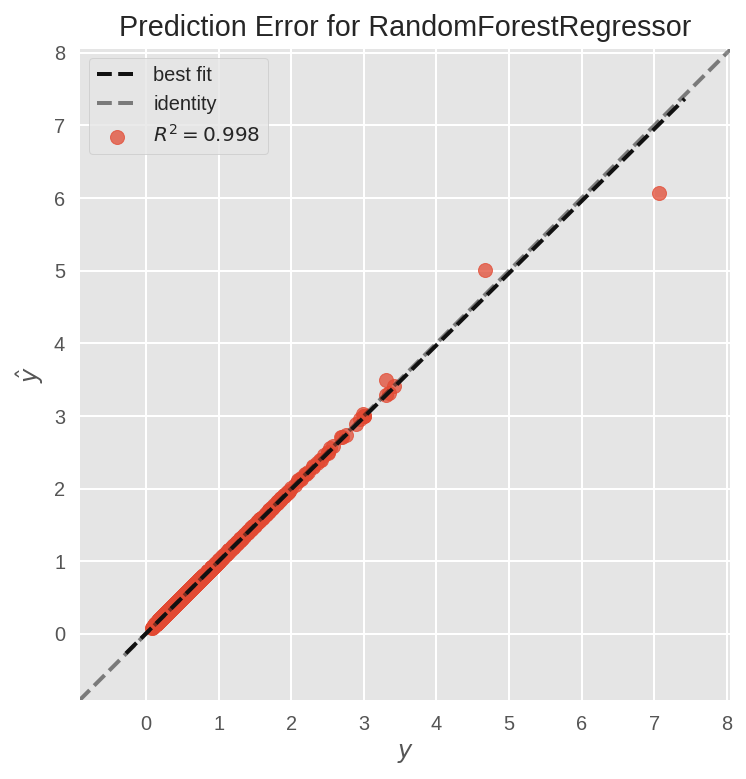

In [28]:
# if predictions are close to truth, we get 45 deg line
fig, ax = plt.subplots(figsize=(8,6)); 

visualizer = PredictionError(model, ax=ax)

visualizer.fit(Xtrain, ytrain)
visualizer.score(Xtest, ytest)
g = visualizer.poof()

# Random Forest Confidence Interval

References:
- http://contrib.scikit-learn.org/forest-confidence-interval/auto_examples/plot_mpg.html#sphx-glr-auto-examples-plot-mpg-py

In [0]:
import forestci as fci

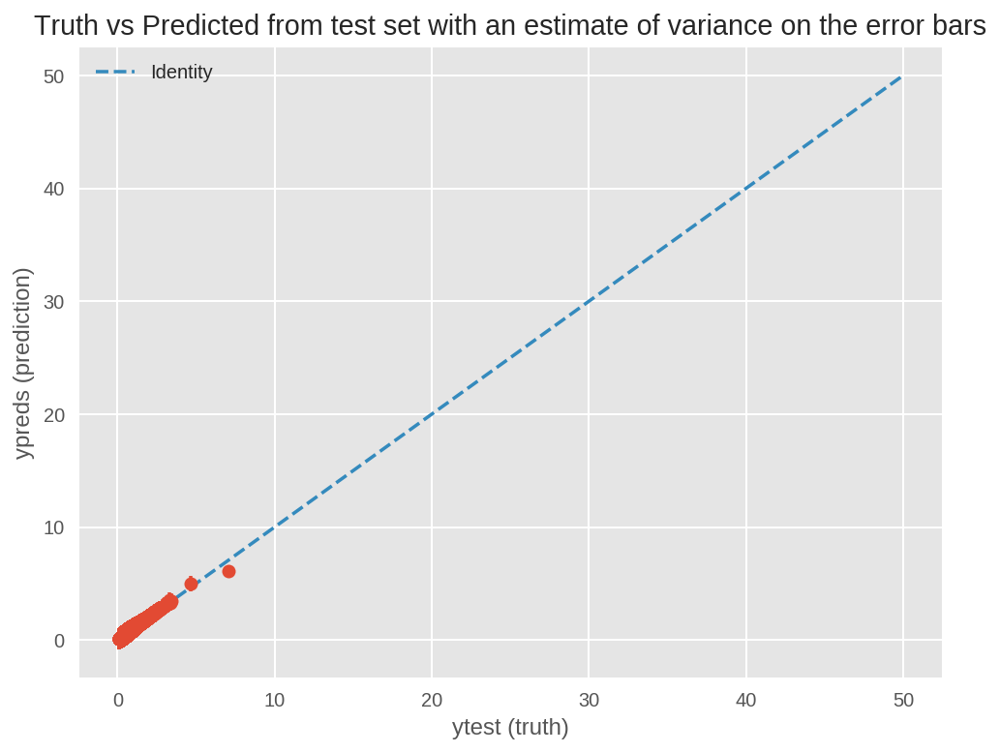

In [30]:
V_IJ_unbiased = fci.random_forest_error(model, Xtrain, Xtest)

ypreds = model.predict(Xtest)

fig, ax = plt.subplots(figsize=(8,6)); 
ax.errorbar(ytest, ypreds, yerr=np.sqrt(V_IJ_unbiased), fmt='o');

ax.set(title="Truth vs Predicted from test set with an estimate of variance on the error bars",
       xlabel="ytest (truth)",
       ylabel="ypreds (prediction)");
plt.plot([0, 50], [0, 50], '--', label="Identity");
plt.legend();

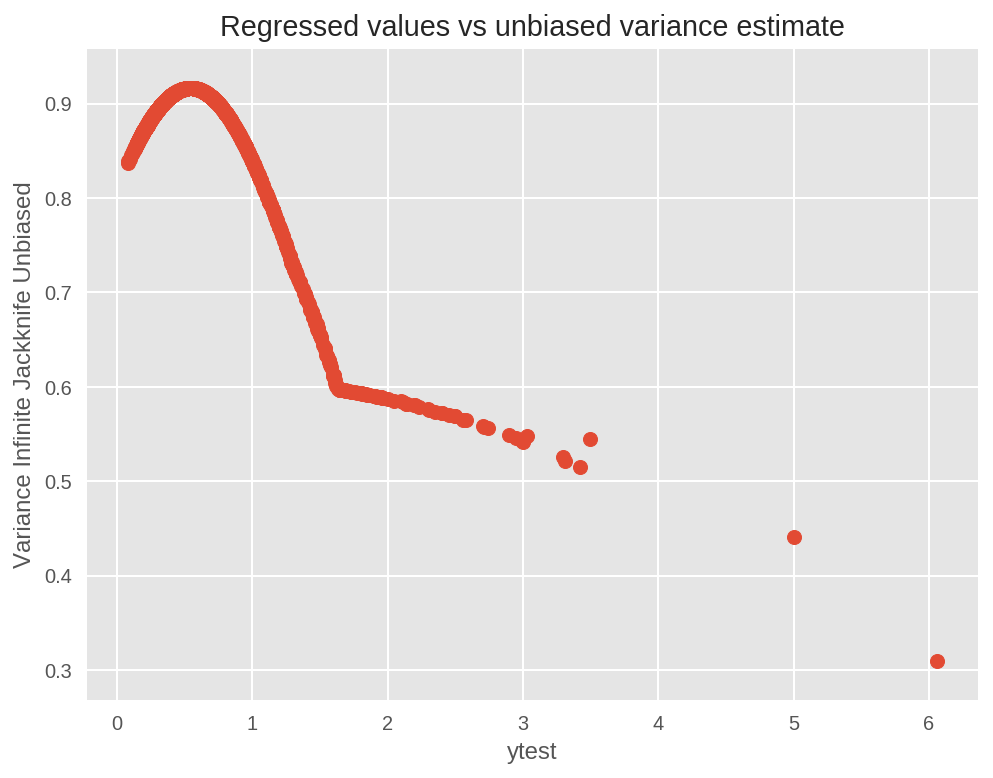

In [31]:
fig, ax = plt.subplots(figsize=(8,6)); 
ax.scatter(ypreds, V_IJ_unbiased);
ax.set(title="Regressed values vs unbiased variance estimate", 
       xlabel="ytest", 
       ylabel="Variance Infinite Jackknife Unbiased");

In [0]:
# If we build estimators on bootstrap samples of the original training set and
# test them all on the same test set, we can see
# if certain parts of the regression range are more variable. 
# This might suggest that our original training data isn't very good
# at properly defining these parts of the regression range.

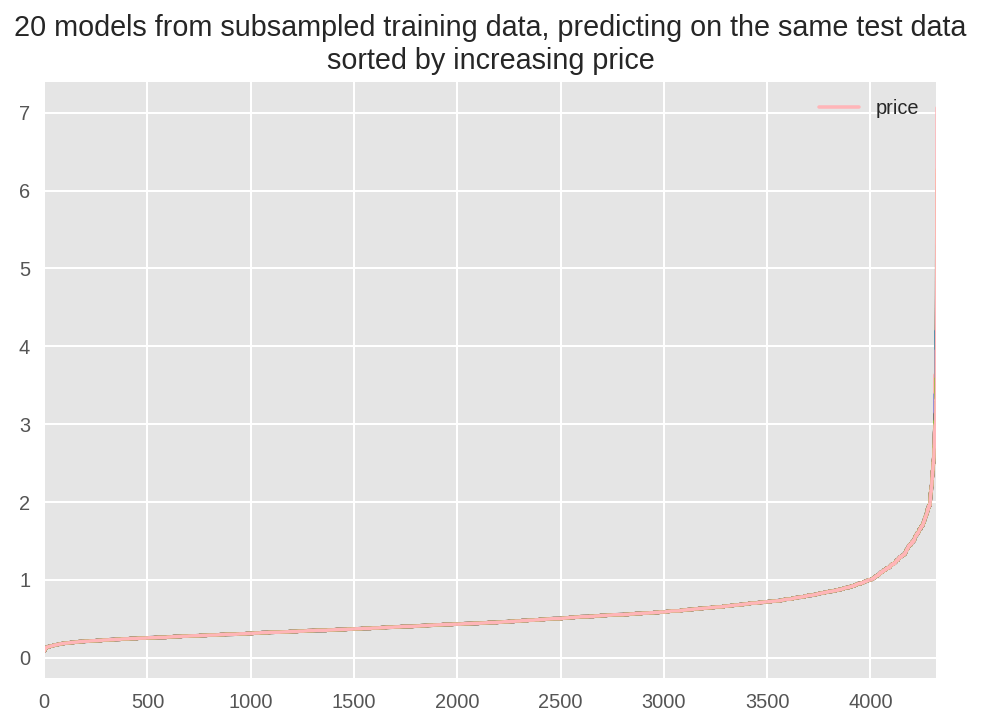

In [33]:
# fixed test set, subsampled training set
# need to identify where the most variance exists
n_items = Xtrain.shape[0]
N_BOOTSTRAP_MODELS = 20

ser_ypreds_subsample = pd.DataFrame({'price': ytest}) 

import copy
model_subsample = copy.copy(model)

for n in range(N_BOOTSTRAP_MODELS):
    train_mask = np.random.uniform(0, n_items, int(n_items * 0.9)).astype(np.int_)
    df_Xtrain_masked = df_Xtrain.iloc[train_mask]
    ser_ytrain_masked = ser_ytrain.iloc[train_mask]
    
    model_subsample.fit(df_Xtrain_masked, ser_ytrain_masked)
    
    mse_train = mean_squared_error(ser_ytrain_masked, model_subsample.predict(df_Xtrain_masked))
    ypreds = model_subsample.predict(Xtest)
    ser_ypreds_subsample[f'prediction_{n}'] = ypreds
    mse_test = mean_squared_error(ytest, ypreds)


fig, ax = plt.subplots()
ser_ypreds_subsample = ser_ypreds_subsample.sort_values(target).reset_index(drop=True)
ser_ypreds_subsample.drop([target], axis=1).plot(ax=ax, legend=False);
ser_ypreds_subsample[target].plot(ax=ax, label=target, legend=True)
ax.set(title="{} models from subsampled training data,\
 predicting on the same test data\nsorted by increasing price".format(N_BOOTSTRAP_MODELS));

plt.show()

In [34]:
ser_ypreds_subsample.head()
# we do not have much variance

,price,prediction_0,prediction_1,prediction_2,prediction_3,prediction_4,prediction_5,prediction_6,prediction_7,prediction_8,prediction_9,prediction_10,prediction_11,prediction_12,prediction_13,prediction_14,prediction_15,prediction_16,prediction_17,prediction_18,prediction_19
0,0.0825,0.08227467803724055,0.08073957480158743,0.08332991666666673,0.0793200000000001,0.07923000000000012,0.08150500000000005,0.08231499999999996,0.07992000000000007,0.08087111111111116,0.08416500000000005,0.07967500000000007,0.08421813067765577,0.08051500000000004,0.08329500000000008,0.08321499999999998,0.08082000000000006,0.0806990833333334,0.07996975000000008,0.08099925000000008,0.08819500000000005
1,0.084,0.08341967803724053,0.08148948389249652,0.08417454166666673,0.08118802857142862,0.08295000000000004,0.08212500000000002,0.08303999999999996,0.08024000000000006,0.08244611111111114,0.08502500000000003,0.08156000000000006,0.08511813067765575,0.08119000000000001,0.08362500000000007,0.0843938888888889,0.08177000000000005,0.08286457619047621,0.08223730000000003,0.08369305032467537,0.08783500000000005
2,0.092,0.08981401866952489,0.08959407132691868,0.08951043333333333,0.09006119007936508,0.08984999999999996,0.08889999999999992,0.08958899999999996,0.08977499999999994,0.09096311111111113,0.09034474999999992,0.09005237189199689,0.08985149568848548,0.08951034848484841,0.09031499999999992,0.08967929159321067,0.08678,0.09045745726079472,0.08943009543650791,0.08994869507437007,0.08975000000000001
3,0.095,0.09447901925296927,0.09354339156223887,0.09437056011904761,0.09702828217893213,0.09333449999999996,0.09572483333333322,0.09484000000000002,0.09462888888888887,0.09573888888888887,0.09181967499999999,0.09388,0.09494660617730226,0.09627127777777772,0.09533500000000003,0.09431540537240535,0.09560305555555555,0.09701725833333333,0.09486882519841273,0.09496279523809527,0.09426500000000003
4,0.1055,0.10693323611111114,0.10523920404040397,0.10421164400599395,0.10632707123015873,0.10518889927572422,0.10556552976190474,0.10564162678571423,0.1046853389971139,0.10600274999999991,0.105463562121212,0.10577639120340444,0.10627882356532346,0.10580360833333323,0.1053503641025641,0.10504739464285706,0.10281434595959583,0.10530018147408135,0.1053486109848484,0.10605980883699631,0.10889810989149738


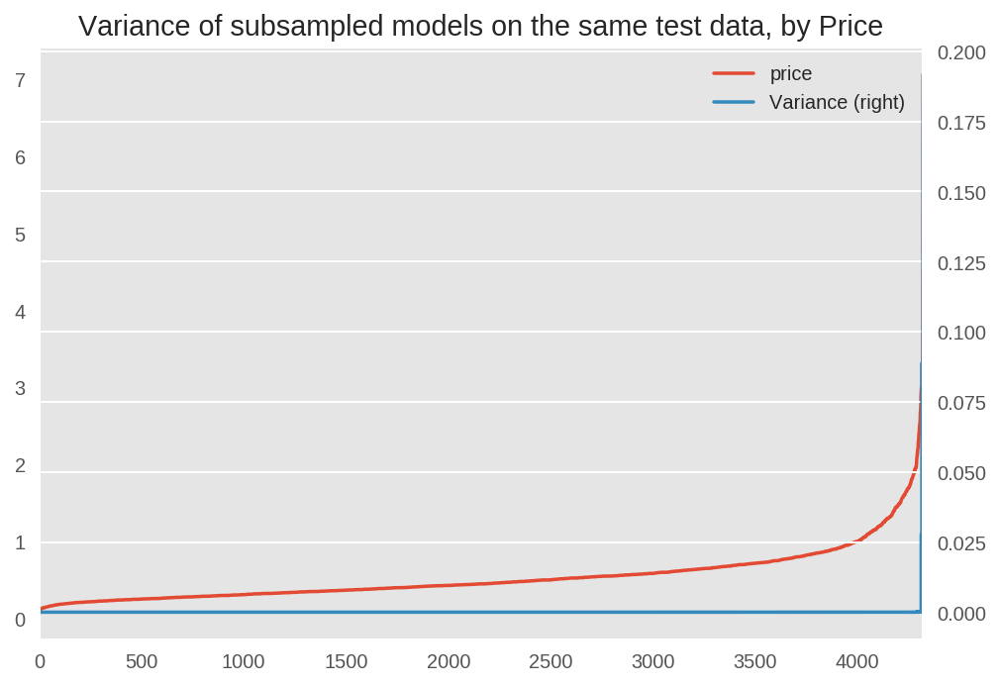

In [35]:
fig, ax = plt.subplots()
ser_ypreds_subsample[target].plot(ax=ax, secondary_y=False,
                                  label=target, legend=True)


ser_ypreds_subsample.drop([target], axis=1).var(axis=1).plot(
    ax=ax, label="Variance", legend=True, secondary_y=True);


ax.set(title="Variance of subsampled models on the same test data, by Price");

# Model Explanation Using Lime

In [36]:
example_to_explain_idx = 14
example_to_explain = df_Xtest.iloc[example_to_explain_idx]
example_to_explain_true_answer = ser_ytest.iloc[example_to_explain_idx]
feature_names = df.columns.drop(target)

print(f"Explaining the {example_to_explain_idx}th row from the testing set")

Explaining the 14th row from the testing set


In [37]:
print("The answer we're looking for is: ", example_to_explain_true_answer)
print("The predicted answer is:", float(model.predict(example_to_explain.values.reshape(-1, 1).T)))
print("The input data X is: ")

The answer we're looking for is:  0.405
The predicted answer is: 0.4049973696496258
The input data X is: 


In [38]:
pd.DataFrame(example_to_explain)

,3565
bedrooms,3.0
bathrooms,1.5
sqft_living,"1,330.0"
sqft_lot,"12,500.0"
floors,1.0
waterfront,0.0
view,0.0
condition,3.0
grade,7.0
sqft_above,"1,330.0"


In [39]:
df_Xtrain.apply(pd.Series.nunique).loc[lambda x: x <10]

floors             6
waterfront         2
view               5
condition          5
yr_sales           2
basement_bool      2
renovation_bool    2
dtype: int64

In [40]:
categorical_features = df_Xtrain.apply(pd.Series.nunique).loc[lambda x: x <10].index.to_list()
categorical_features

['floors',
 'waterfront',
 'view',
 'condition',
 'yr_sales',
 'basement_bool',
 'renovation_bool']

In [41]:
categorical_features_idx = [df_Xtrain.columns.get_loc(x) for x in categorical_features]
categorical_features_idx

[4, 5, 6, 7, 18, 23, 24]

In [0]:
feature_names = df_Xtrain.columns.to_list()
categorical_features = categorical_features_idx
explainer = lime.lime_tabular.LimeTabularExplainer(Xtrain, 
                                                   feature_names=feature_names, 
                                                   class_names=['price'], 
                                                   categorical_features=categorical_features_idx, 
                                                   verbose=True, 
                                                   mode='regression')

# Lime Uses perturbed data neighborhood_data and neighborhood_labels
# Intercept is the generated linear model's intercept
# Prediction_local is the predicted output from the linear model
# Right is the predicted value from the explained regressor (not LIME's linear model)

In [43]:
exp = explainer.explain_instance(example_to_explain, model.predict, num_features=10)

Intercept 0.6480157529154251
Prediction_local [0.357]
Right: 0.4049973696496258


In [44]:
exp.show_in_notebook(show_table=True)

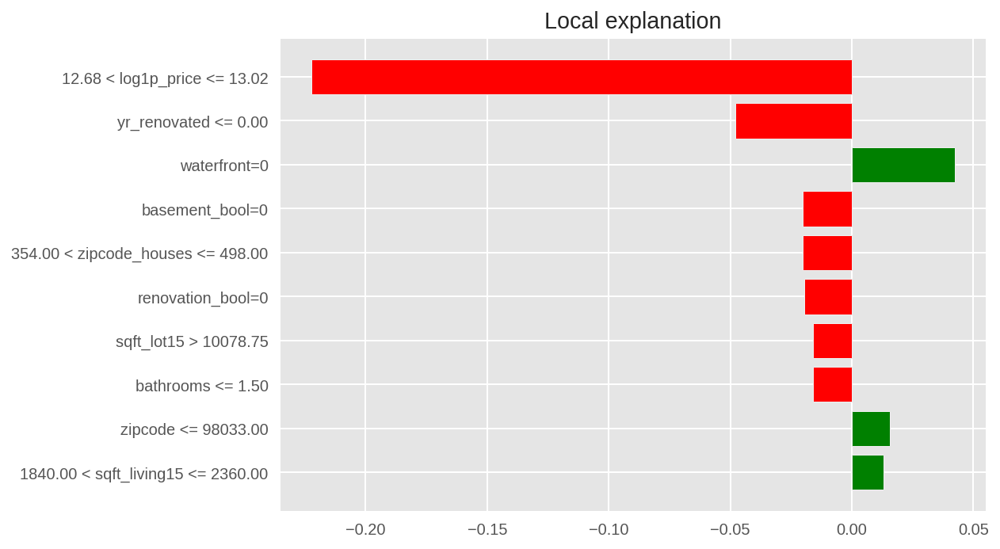

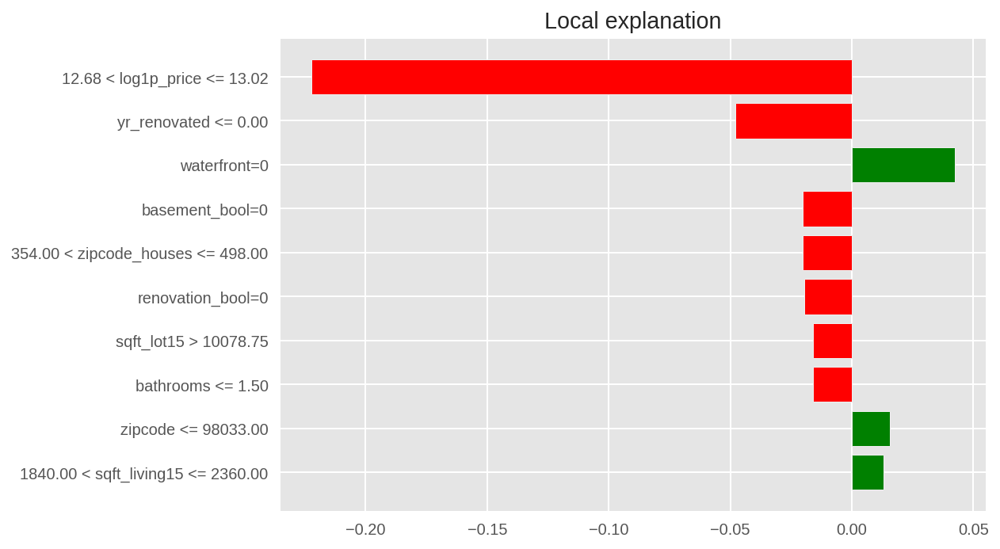

In [45]:
exp.as_pyplot_figure()
# note that the double-plot is a bug: https://github.com/marcotcr/lime/issues/89

In [46]:
lst = exp.as_list()
lst

[('12.68 < log1p_price <= 13.02', -0.2222302901554395),
 ('yr_renovated <= 0.00', -0.04793109429889163),
 ('waterfront=0', 0.04232726348069543),
 ('basement_bool=0', -0.02034272356816161),
 ('354.00 < zipcode_houses <= 498.00', -0.020178726238307663),
 ('renovation_bool=0', -0.019645222397943085),
 ('sqft_lot15 > 10078.75', -0.01591928362502494),
 ('bathrooms <= 1.50', -0.01591438025705289),
 ('zipcode <= 98033.00', 0.015558910003153879),
 ('1840.00 < sqft_living15 <= 2360.00', 0.012896239473046951)]

In [47]:
pd.DataFrame(lst)

,0,1
0,12.68 < log1p_price <= 13.02,-0.2222302901554395
1,yr_renovated <= 0.00,-0.04793109429889163
2,waterfront=0,0.04232726348069543
3,basement_bool=0,-0.02034272356816161
4,354.00 < zipcode_houses <= 498.00,-0.020178726238307663
5,renovation_bool=0,-0.019645222397943085
6,sqft_lot15 > 10078.75,-0.01591928362502494
7,bathrooms <= 1.50,-0.01591438025705289
8,zipcode <= 98033.00,0.015558910003153879
9,1840.00 < sqft_living15 <= 2360.00,0.012896239473046951


# Model Intrepretation using ELI5

In [0]:
import eli5
from eli5 import show_weights
from eli5 import show_prediction

In [49]:
print("BIAS is the mean of the training data (i.e. a guess prior to using any features):", ytrain.mean())

BIAS is the mean of the training data (i.e. a guess prior to using any features): 0.5395247533834586


In [50]:
model

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=100, verbose=0,
                      warm_start=False)

In [51]:
feature_names = df_Xtrain.columns.to_list()

show_prediction(model, 
                example_to_explain,
                feature_names=feature_names, 
                show_feature_values=True)

# Feature Importances

In [52]:
df_imp = pd.DataFrame({'feature_importances_': model.feature_importances_}, index=feature_names)
df_imp.sort_values(by="feature_importances_", ascending=False).head(10).round(4)

,feature_importances_
log1p_price,0.9949
sqft_living,0.0011
log1p_sqft_living,0.001
sqft_above,0.0006
bathrooms,0.0005
log1p_sqft_above,0.0004
zipcode_houses,0.0002
long,0.0002
age_after_renovation,0.0001
grade,0.0001


In [0]:
# using eli5 importance visualizer
# Note that the +/- value assumes a Gaussian and the boxplot below shows that this isn't true

In [54]:
show_weights(model, feature_names=feature_names)

Weight,Feature
0.9949 ± 0.0128,log1p_price
0.0011 ± 0.0091,sqft_living
0.0010 ± 0.0093,log1p_sqft_living
0.0006 ± 0.0037,sqft_above
0.0005 ± 0.0033,bathrooms
0.0004 ± 0.0026,log1p_sqft_above
0.0002 ± 0.0021,zipcode_houses
0.0002 ± 0.0016,long
0.0001 ± 0.0015,age_after_renovation
0.0001 ± 0.0014,grade


## ELI5's Permutation Importance on the same features

In [55]:
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model).fit(Xtest, ytest)
eli5.show_weights(perm, feature_names=feature_names)

Weight,Feature
1.9504 ± 0.0555,log1p_price
0.0009 ± 0.0000,sqft_living
0.0009 ± 0.0000,sqft_above
0.0007 ± 0.0000,log1p_sqft_above
0.0005 ± 0.0000,log1p_sqft_living
0.0001 ± 0.0000,renovation_bool
0.0001 ± 0.0000,yr_renovated
0.0001 ± 0.0001,lat
0.0001 ± 0.0000,age_cat
0.0001 ± 0.0000,log1p_sqft_living15


# Feature importance as a box plot

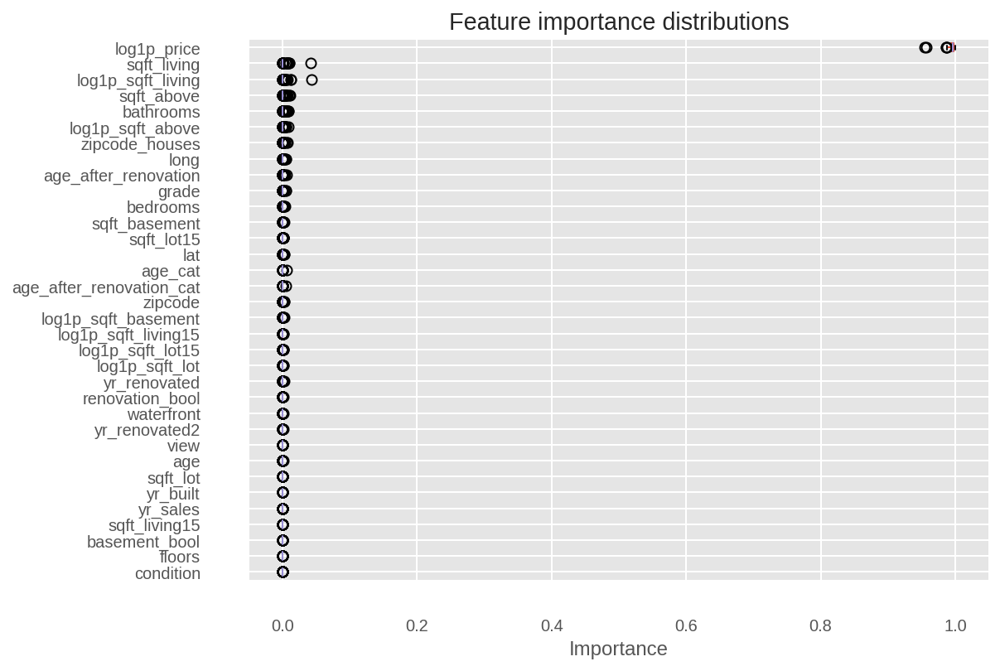

In [56]:
feature_names = df_Xtrain.columns.to_list()

df_imp = pd.DataFrame()

for est_idx, est_tree in enumerate(model.estimators_):
    df_imp["tree_{}".format(est_idx)] = est_tree.feature_importances_

df_imp.index = feature_names
df_imp = df_imp.T

sorted_index = df_imp.mean(axis=0).sort_values().index

fig, ax = plt.subplots(figsize=(8,6)); 
df_imp[sorted_index].plot(kind="box", vert=False, ax=ax, title="Feature importance distributions");
ax.set_xlabel("Importance")

# remove right/top border to make things slightly neater
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')

# visual tidy-up to make left axis small values slightly easier to read
# offset left and bottom axis
ax.spines['bottom'].set_position(('axes', -0.05))
ax.yaxis.set_ticks_position('left')
ax.spines['left'].set_position(('axes', -0.05))

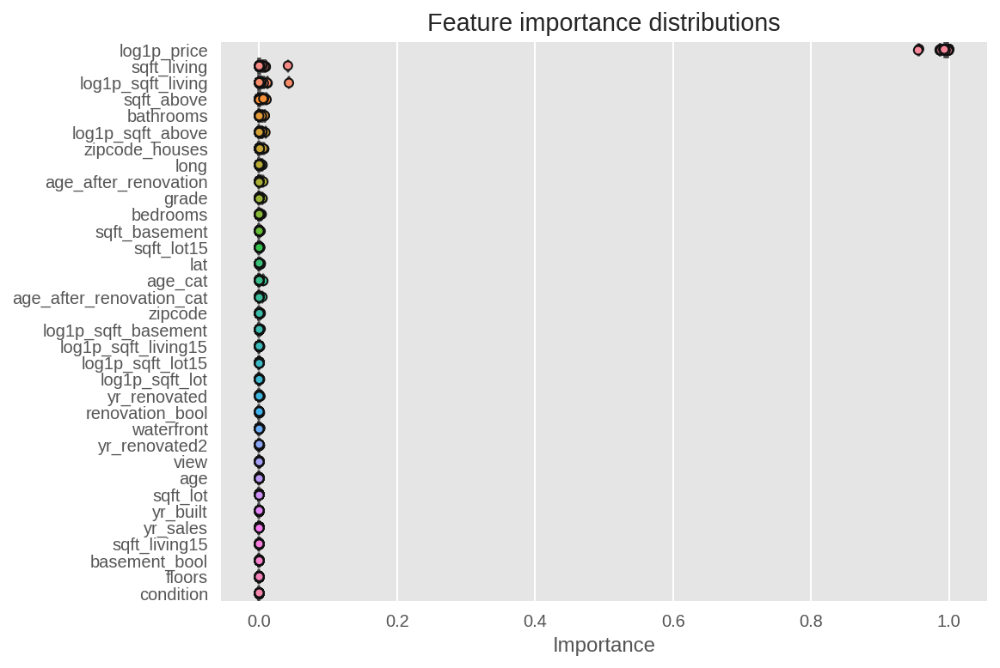

In [57]:
fig, ax = plt.subplots(figsize=(8,6)); 
sns.stripplot(data=df_imp[sorted_index[::-1]], jitter=0.05, orient="h", ax=ax, edgecolor="k", linewidth=1);
sns.boxplot(data=df_imp[sorted_index[::-1]], orient="h", ax=ax);
ax.set_title("Feature importance distributions");
ax.set_xlabel("Importance");

# Weights of a tree in a small forest

In [58]:
show_weights(model, feature_names=feature_names, show="description")

In [59]:
est_depth_3 = sklearn.ensemble.RandomForestRegressor(n_estimators=10,
                                             max_depth=3,
                                             random_state=0)

print("Sizes for train {}, test {}".format(Xtrain.shape, Xtest.shape))
est_depth_3.fit(Xtrain, ytrain)


est_tree0 = est_depth_3.estimators_[0]

Sizes for train (17290, 34), test (4323, 34)


In [60]:
show_weights(est_tree0, feature_names=feature_names)

Weight,Feature
1.0000,log1p_price
0,log1p_sqft_living
0,sqft_lot
0,floors
0,waterfront
0,view
0,condition
0,grade
0,sqft_above
0,sqft_basement


In [61]:
est_tree1 = est_depth_3.estimators_[1]
show_weights(est_tree1, feature_names=feature_names)

Weight,Feature
1.0000,log1p_price
0,log1p_sqft_living
0,sqft_lot
0,floors
0,waterfront
0,view
0,condition
0,grade
0,sqft_above
0,sqft_basement


# sklearn Random Forest plot tree using graphviz

In [0]:
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestRegressor

In [0]:
model = RandomForestRegressor(n_estimators=10)

In [64]:
model.fit(Xtrain,ytrain)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [65]:
last_decision_tree = model.estimators_[-1]
last_decision_tree

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features='auto',
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=26530551, splitter='best')

In [0]:
# Export as dot file
export_graphviz(last_decision_tree, out_file='tree.dot', 
                feature_names = feature_names,
                class_names = target,
                rounded = True,
                proportion = False, 
                precision = 2,
                filled = True)

In [67]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

0

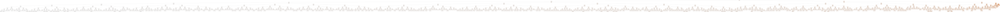

In [68]:
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [0]:
import pydotplus

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.247113 to fit



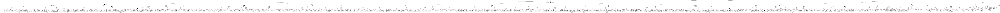

In [70]:
# Create DOT data
dot_data = sklearn.tree.export_graphviz(last_decision_tree, out_file=None, 
                                feature_names=feature_names,  
                                class_names=target)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)  

# Show graph
Image(graph.create_png())

In [71]:
# Create PDF
graph.write_pdf("forest.pdf")

# Create PNG
graph.write_png("forest.png")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.247113 to fit



True

In [72]:
!pip install dtreeviz

# Decision Tree visualization using dtreeviz
Ref: https://github.com/parrt/dtreeviz

In [0]:
import dtreeviz

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features='auto',
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=26530551, splitter='best')

In [76]:
Xtrain.shape, len(feature_names), target

((17290, 34), 34, 'price')

In [78]:
df_Xtrain.head(2)

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sales,age,yr_renovated2,age_after_renovation,zipcode_houses,basement_bool,renovation_bool,age_cat,age_after_renovation_cat,log1p_price,log1p_sqft_living,log1p_sqft_lot,log1p_sqft_above,log1p_sqft_basement,log1p_sqft_living15,log1p_sqft_lot15
16000,3,1.75,1780,11096,1.0,0,0,3,7,1210,570,1979,0,98074,47.617,-122.051,1780,10640,2014,35,1979,35,441,1,0,3,3,12.691583538230214,7.484930283289661,9.314430080500564,7.099201743553093,6.3473892096560105,7.484930283289661,9.272469743441732
11286,2,2.5,1420,2229,2.0,0,0,3,7,1420,0,2004,0,98059,47.4871,-122.165,1500,2230,2014,10,2004,10,468,0,0,0,0,12.53537998978861,7.2591161280971015,7.709756864454165,7.2591161280971015,0.0,7.313886831633463,7.710205194432532


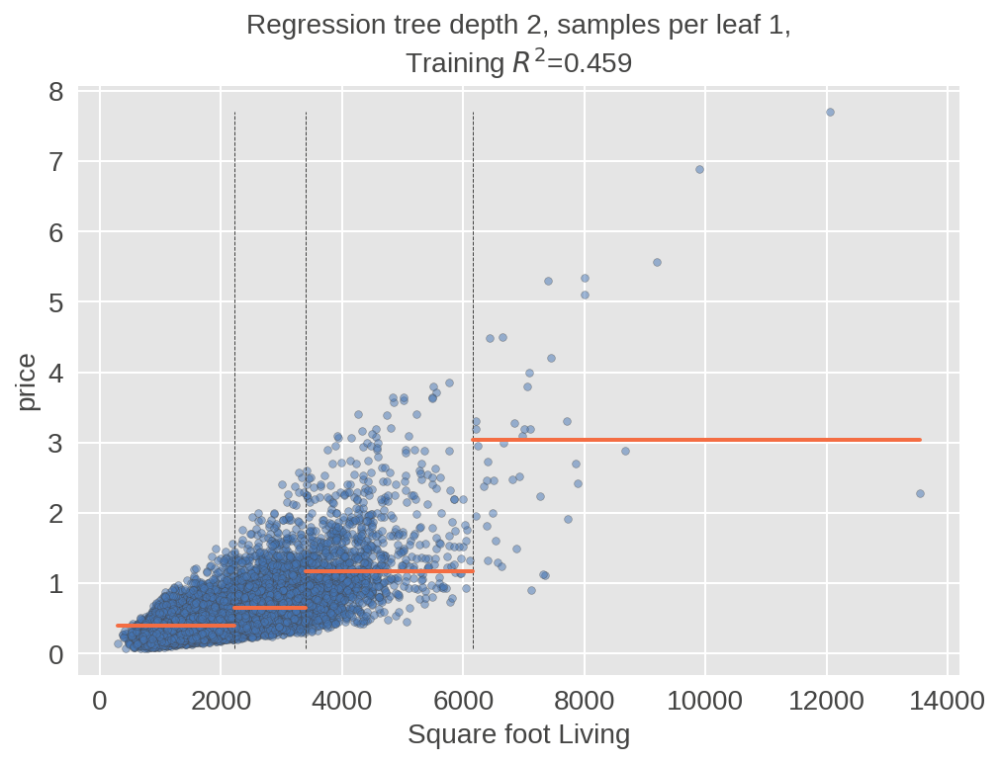

In [79]:
from dtreeviz.trees import rtreeviz_univar

fig = plt.figure()
ax = fig.gca()
t = rtreeviz_univar(ax,
                    df_Xtrain['sqft_living'], ytrain,
                    max_depth=2,
                    feature_name='Square foot Living',
                    target_name='price',
                    fontsize=14)
plt.show()

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


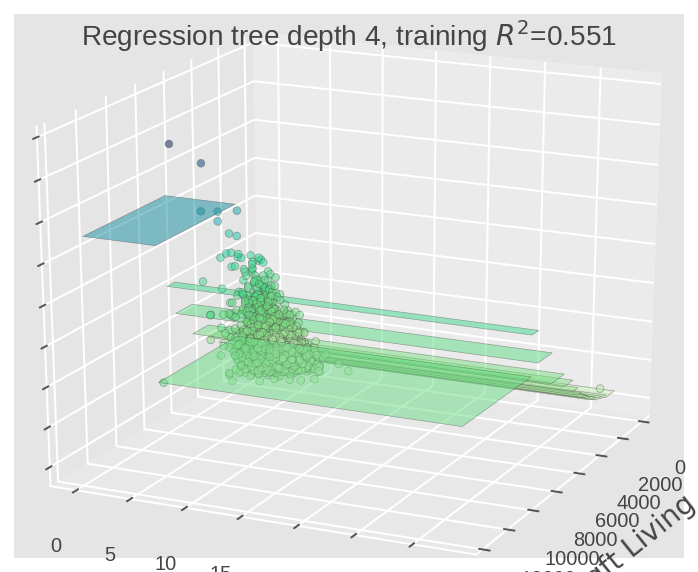

In [80]:
from mpl_toolkits.mplot3d import Axes3D
from dtreeviz.trees import rtreeviz_bivar_3D

features = ['sqft_living', 'bedrooms']


figsize = (6,5)
fig = plt.figure(figsize=figsize)
ax = fig.add_subplot(111, projection='3d')

t = rtreeviz_bivar_3D(ax,
                      df_Xtrain[features],ytrain,
                      max_depth=4,
                      feature_names=['Sqft Living', 'Bedrooms'],
                      target_name='price',
                      fontsize=14,
                      elev=20,
                      azim=25,
                      dist=8.2,
                      show={'splits','title'})
plt.show()

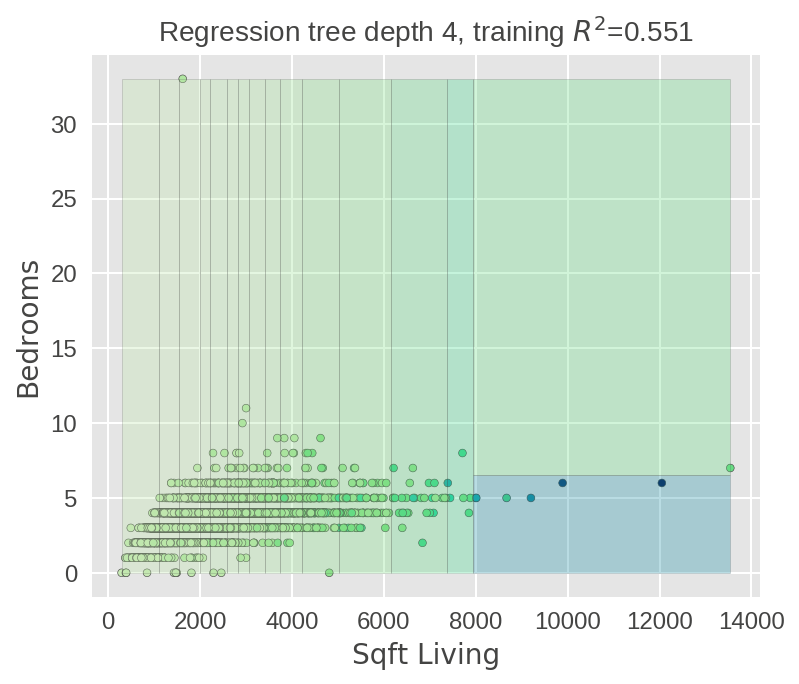

In [81]:
from dtreeviz.trees import rtreeviz_bivar_heatmap

figsize = (6, 5)
fig, ax = plt.subplots(1, 1, figsize=figsize)
t = rtreeviz_bivar_heatmap(ax,
                           df_Xtrain[features],ytrain,
                           max_depth=4,
                           feature_names=['Sqft Living', 'Bedrooms'],
                           fontsize=14)
plt.show()

In [82]:
last_decision_tree

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features='auto',
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=26530551, splitter='best')

In [0]:
# feature_names

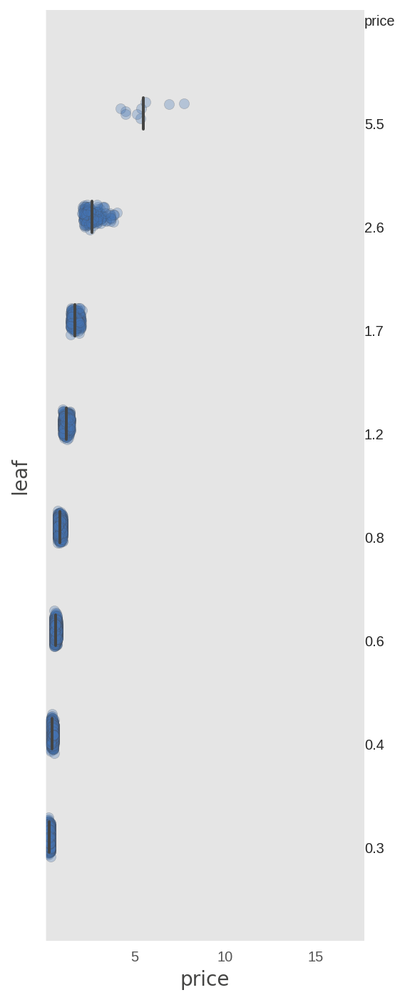

In [85]:
from dtreeviz.trees import viz_leaf_target


dtr = DecisionTreeRegressor(max_depth=3, random_state=SEED)

dtr.fit(df_Xtrain,ytrain)

viz_leaf_target(dtr,
                df_Xtrain,ytrain,
                feature_names, 
                target,
                show_leaf_labels=True,
                grid=False,
                figsize=(4,12))

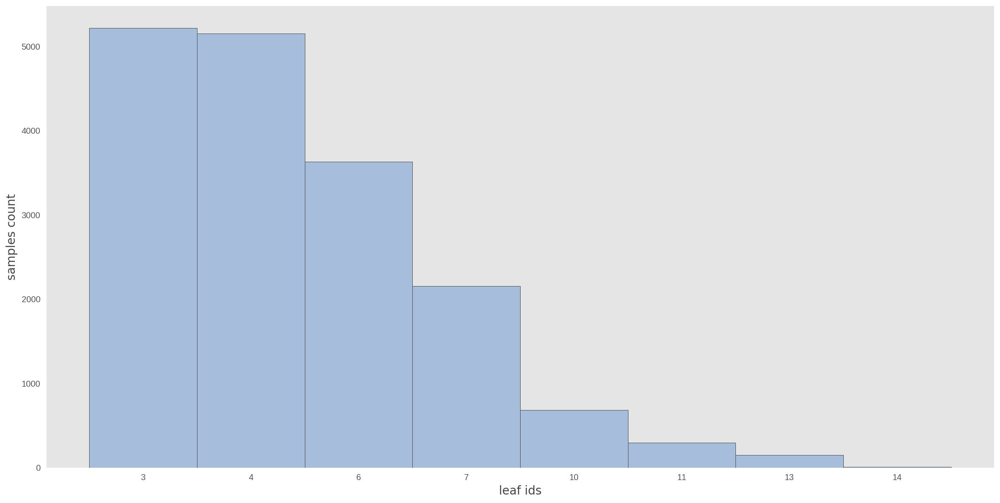

In [86]:
from dtreeviz.trees import viz_leaf_samples

viz_leaf_samples(dtr, figsize=(20,10))

In [87]:
viz_leaf_samples(dtr, display_type="text")

leaf 3 has 5216 samples
leaf 4 has 5151 samples
leaf 6 has 3632 samples
leaf 7 has 2155 samples
leaf 10 has 683 samples
leaf 11 has 294 samples
leaf 13 has 150 samples
leaf 14 has 9 samples


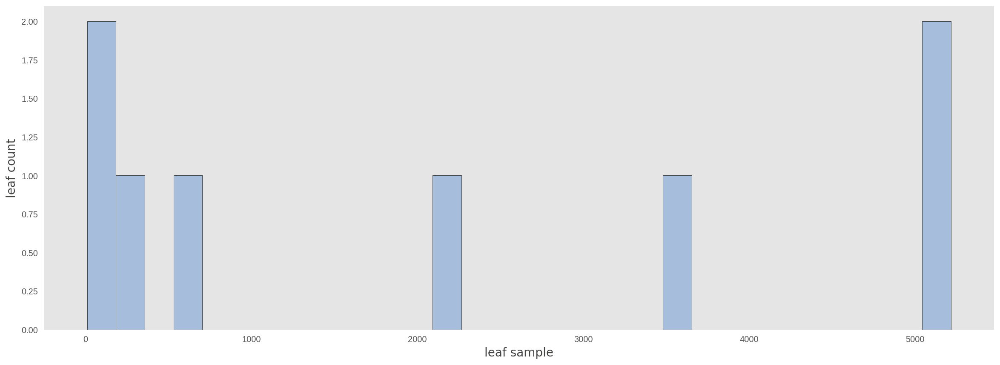

In [88]:
#Useful when you want to easily see the general distribution of leaf samples.
viz_leaf_samples(dtr, display_type="hist", bins=30, figsize=(20,7))